# Torchlens: A Package for Extracting and Understanding the Results of Every Single Operation Performed in a PyTorch Model with Minimal Code

In [1]:
import torch
from torch import nn
import torchvision
import torchlens as tl

### Quick Overview

The core function of torchlens is **get_model_activations**: it returns a full log of what happens in the forward pass of a PyTorch model given some input, including all saved activations and further information about the model's computation graph. It really does log the results of <u>**every**</u> tensor operation in the network, including:
- all passes of recurrent operations,
- operations that are not tied to a module (e.g., nn.functional.relu; these are missed by typical feature extraction approaches in PyTorch that involve attaching hooks to modules)
- operations that only happen if the input meets some if-then condition, and
- operations on internally-generated tensors (e.g., from torch.zeros or torch.rand)

Torchlens works by dynamically tracking tensors as they propagate through each operation in the network, abstracting away from any details of how the model programmer happened to organize the model's code and providing an intuitive "lingua franca" for comparing the structure of different models (although a network's modular structure is retained as an organizational aid). The model can be fed into this function as-is, no changes required. The goal of torchlens is to work for any PyTorch model whatsoever; currently, it has been tested for the whole torchvision model zoo, the [cornet](https://dicarlolab.mit.edu/cornet-modeling-neural-mechanisms-core-object-recognition) model family, and the [taskonomy](http://taskonomy.stanford.edu/) network model, with a built-in validation procedure (described later) to verify the correctness of saved activations for new models.

Since logging all operations in this way constitutes a full record of the model's computational graph, torchlens also allows you to visualize the graph (by setting vis_opt to 'unrolled' or 'rolled'), giving an at-a-glance understanding of what the network is doing and the specific place of each layer in the forward pass.

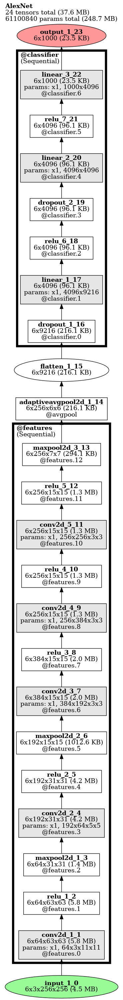

*****Object containing full log of what happens in the forward pass******
Log of AlexNet forward pass:
	Model structure: purely feedforward, without branching; 23 total modules.
	24 tensors (37.6 MB) computed in forward pass; 24 tensors (37.6 MB) saved.
	16 parameter operations (61100840 params total; 248.7 MB).
	Random seed: 3713623734
	Time elapsed: 0.392s
	Module Hierarchy:
		features:
		    features.0, features.1, features.2, features.3, features.4, features.5, features.6, features.7, 
		    features.8, features.9, features.10, features.11, features.12
		avgpool
		classifier:
		    classifier.0, classifier.1, classifier.2, classifier.3, classifier.4, classifier.5, classifier.6
	Layers:
		0: input_1_0 
		1: conv2d_1_1 
		2: relu_1_2 
		3: maxpool2d_1_3 
		4: conv2d_2_4 
		5: relu_2_5 
		6: maxpool2d_2_6 
		7: conv2d_3_7 
		8: relu_3_8 
		9: conv2d_4_9 
		10: relu_4_10 
		11: conv2d_5_11 
		12: relu_5_12 
		13: maxpool2d_3_13 
		14: adaptiveavgpool2d_1_14 
		15: flatten_1_15 
		16: d

In [2]:
alexnet = torchvision.models.AlexNet()
x = torch.rand(6, 3, 256, 256)

# A single function call saves and logs all activations with no changes to the model required, and optionally shows a graph of the forward pass.
model_history = tl.get_model_activations(alexnet, x, vis_opt="unrolled")
print("*****Object containing full log of what happens in the forward pass******")
print(model_history)  # The log contains data about the whole model.

print("\n\n*****The first conv layer, and seventh layer overall******")
print(
    model_history["conv2d_3_7"]
)  # You can index the log with a layer name (the visual helps) to get the data for that layer.

print(
    "\n\n*****Results of the flatten operation before the fully connected layers******"
)
print(
    model_history["flatten_1_15"]
)  # This works even if the computation is not associated with a PyTorch module.

print("\n\n*****Output of classifier.2 submodule******")
print(
    model_history["classifier.2"]
)  # You can also fetch layers based on the module for which they are the output...

print("\n\n*****Output of features submodule******")
print(model_history["features"])  # ...at any level of module nesting.

print("\n\n*****Output of second layer******")
print(
    model_history[2]
)  # You can also index the history by a layer's ordinal position (here the 3rd layer)...

print("\n\n*****Output of fourth-to-last layer******")
print(
    model_history[-4]
)  # ...and negative indices work just like a Python list (e.g., fourth-to-last layer).

print("\n\n*****Tensor contents for a layer******")
print(
    model_history[2].tensor_contents
)  # The tensor contents field fetches the actual saved tensor data from an entry.

The graph in the resulting visual shows the results of each tensor operation as a node, with edges indicating that the output of one operation is the input to another. It uses the following visual code:
- <font color='green'>Green</font> nodes are model inputs,
- <font color='red'>Red</font> nodes are model outputs,
- <font color='grey'>Grey</font>-shaded nodes have parameters associated with them,
- Rectangular nodes are associated with modules,
- Ellipse-shaped nodes are operations that are not tied to modules (e.g., flatten),
- and box outlines show higher-level modules (e.g., the 'features' module of AlexNet).

Each node is marked with the shape and size of the tensor, any parameters linked with the operation, and the module in which the computation happens (marked with "@"); the visual also has metadata about the whole network.

## Example Models
Torchlens is designed to work for arbitrary models, with no model-specific tweaks required.



### A simple feed-forward network:


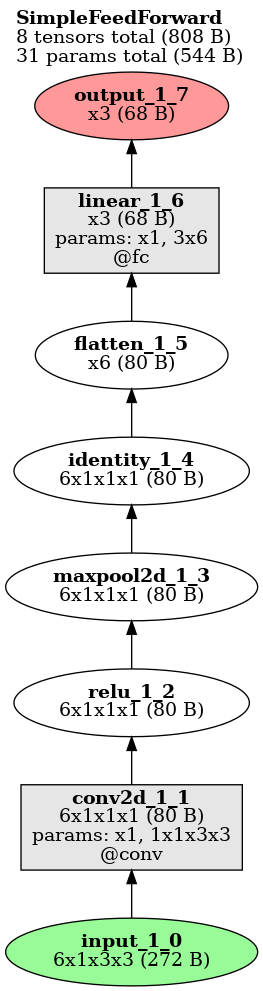

In [3]:
class SimpleFeedForward(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(1, 1, 3, padding=0)
        self.fc = nn.Linear(6, 3)
        self.identity = nn.Identity()

    def forward(self, x):
        x = self.conv(x)
        x = nn.functional.relu(x)
        x = nn.functional.max_pool2d(x, 1)
        x = self.identity(x)
        x = x.flatten()
        x = self.fc(x)
        return x


x = torch.rand(6, 1, 3, 3)
ff_model = SimpleFeedForward()
model_history = tl.get_model_activations(ff_model, x, vis_opt="unrolled")

### Full support for recurrent networks
A simple recurrent network, visualized in unrolled form (different passes of a layer are denoted with colons; e.g., linear_1_1:3 is the third pass of this fully-connected layer).


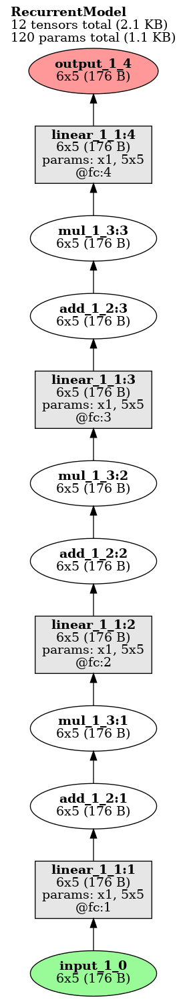

Layer linear_1_1(pass 3/4), operation 8/12:
	Output tensor: shape=(6, 5), dype=torch.float32, size=176 B
		tensor([[ 0.9103,  2.3672,  0.2949, -0.3868, -1.0732],
        [ 0.8819,  2.3296,  0.3233, -0.3968, -1.0528],
        [ 0.8516,  2.2756,  0.3302, -0.2557, -1.0833],
        [ 0.9168,  2.3882,  0.2989, -0.4387, -1.0589],
        [ 0.8559,  2.3363,  0.2185, -0.3652, -1.0044]],
       grad_fn=<SliceBackward>)...
	Params: Computed from params with shape (5,), (5, 5); 30 params total (232 B)
	Parent Layers: mul_1_3:2
	Child Layers: add_1_2:3
	Function: linear (gradfunc=AddmmBackward) 
	Computed inside module: fc
	Time elapsed:  7.164E-04s
	Output of modules: fc
	Output of bottom-level module: fc
	Lookup keys: -5, 7, fc:3, linear_1_1:3

In [4]:
class RecurrentModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Linear(in_features=5, out_features=5)

    def forward(self, x):
        x = self.fc(x)
        x = x + 1
        x = x * 2
        x = self.fc(x)
        x = x + 1
        x = x * 2
        x = self.fc(x)
        x = x + 1
        x = x * 2
        x = self.fc(x)
        return x


x = torch.rand(6, 5)
recurrent_mod = RecurrentModel()
tl.get_model_activations(recurrent_mod, x, vis_opt="unrolled")["linear_1_1:3"]

#### Recurrent networks can also be visualized in rolled-up form

Incoming and outgoing edges are labeled with the numbers of the passes for which they occur (e.g., here passes 1-3 leaving from linear_1_1 go to add_1_2, with the output leaving the loop and going to output_1_4 on the fourth and final pass).

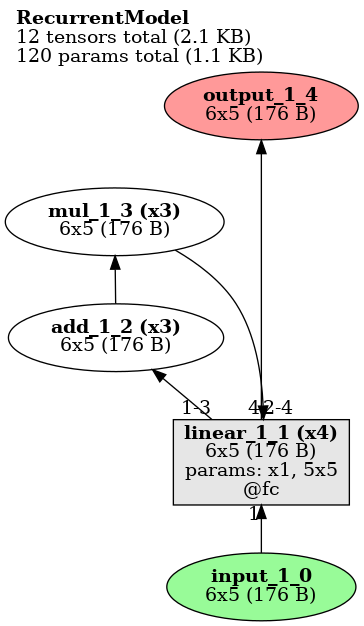

In [5]:
tl.show_model_graph(recurrent_mod, x, vis_opt="rolled")

### Branching Model
(Note: since models with branching don't have a single well-defined layer order, ordering is defined with a topological sort procedure such that child tensors always follow their parents).

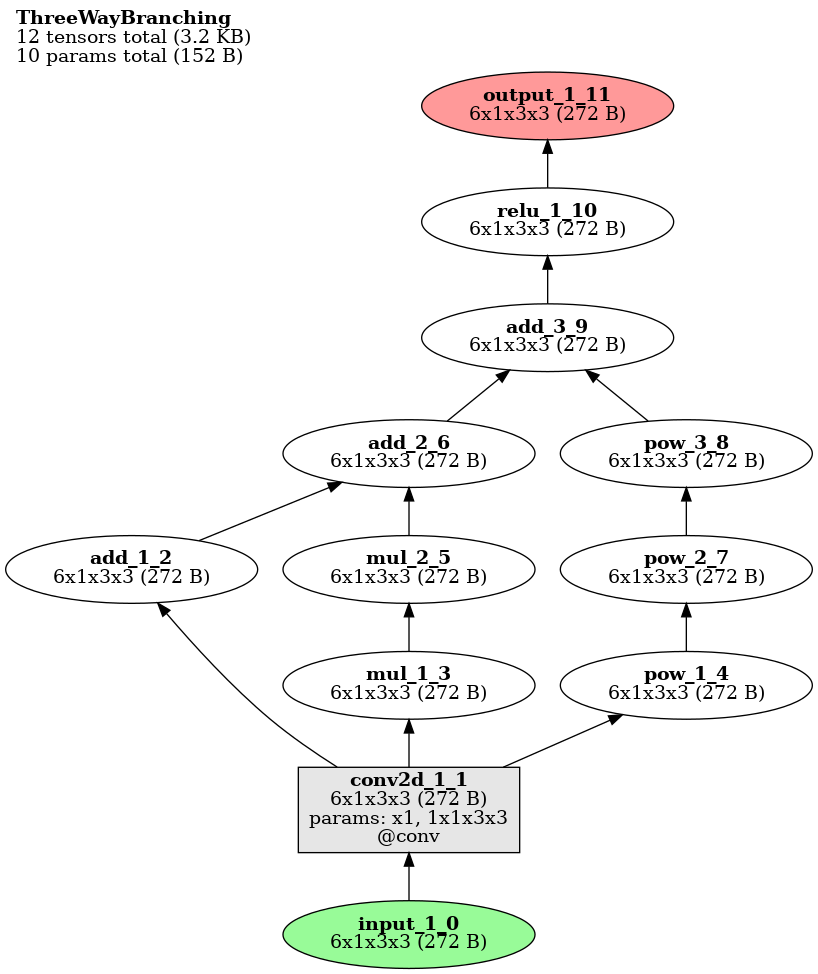

Log of ThreeWayBranching forward pass:
	Model structure: purely feedforward, with branching; 1 total modules.
	12 tensors (3.2 KB) computed in forward pass; 12 tensors (3.2 KB) saved.
	2 parameter operations (10 params total; 152 B).
	Random seed: 3385087141
	Time elapsed: 0.014s
	Module Hierarchy:
		conv
	Layers:
		0: input_1_0 
		1: conv2d_1_1 
		2: add_1_2 
		3: mul_1_3 
		4: pow_1_4 
		5: mul_2_5 
		6: add_2_6 
		7: pow_2_7 
		8: pow_3_8 
		9: add_3_9 
		10: relu_1_10 
		11: output_1_11 

In [6]:
class ThreeWayBranching(nn.Module):
    def __init__(self):
        """Conv, relu, pool, fc, output."""
        super().__init__()
        self.conv = nn.Conv2d(1, 1, 3, padding=1)

    def forward(self, x):
        x = self.conv(x)
        a = x + 1
        b = x * 2
        b = b * 3
        c = x**2
        c = c**3
        c = c**4
        x = a + b + c
        x = nn.functional.relu(x)
        return x


x = torch.rand(6, 1, 3, 3)
branching_model = ThreeWayBranching()
tl.get_model_activations(branching_model, x, vis_opt="unrolled")

### Model with internally-generated tensors
Internally generated tensors (e.g., from torch.ones, torch.zeros, torch.rand) are shown with dotted outlines in the visual until they meet a tensor that came from the model input.

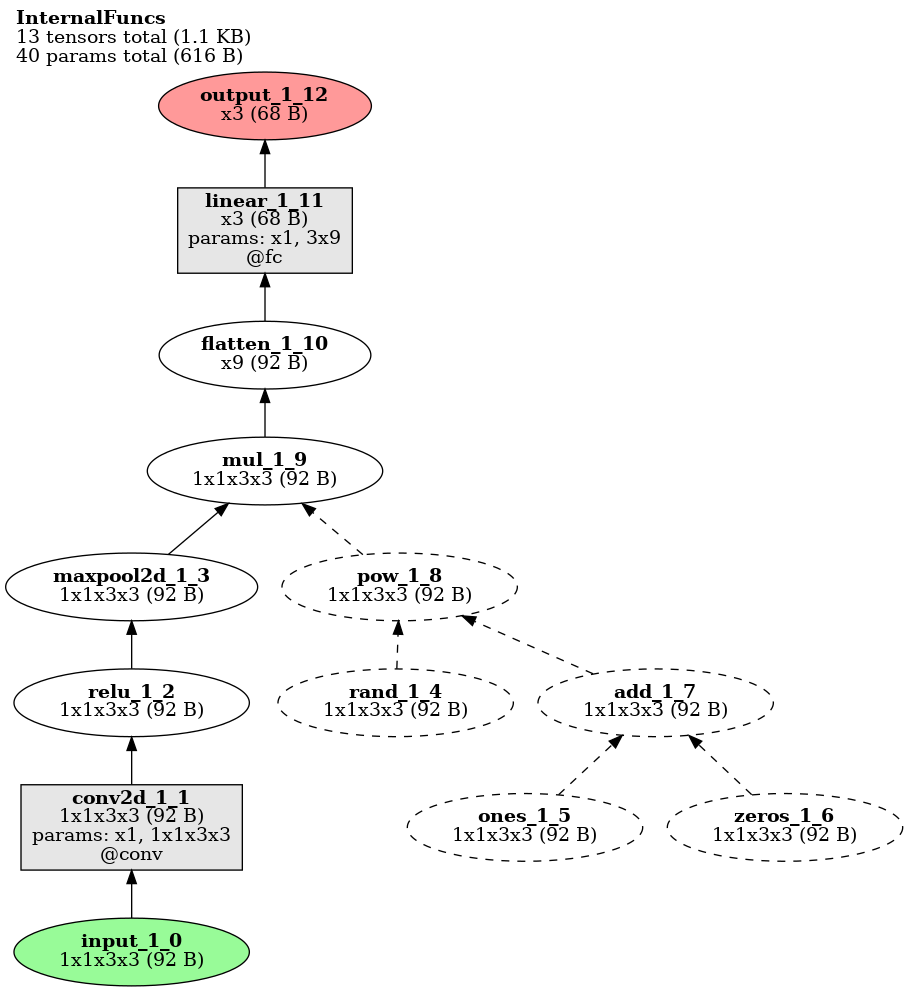

Log of InternalFuncs forward pass:
	Model structure: purely feedforward, without branching; 2 total modules.
	13 tensors (1.1 KB) computed in forward pass; 13 tensors (1.1 KB) saved.
	4 parameter operations (40 params total; 616 B).
	Random seed: 1570565943
	Time elapsed: 0.02s
	Module Hierarchy:
		conv
		fc
	Layers:
		0: input_1_0 
		1: conv2d_1_1 
		2: relu_1_2 
		3: maxpool2d_1_3 
		4: rand_1_4 
		5: ones_1_5 
		6: zeros_1_6 
		7: add_1_7 
		8: pow_1_8 
		9: mul_1_9 
		10: flatten_1_10 
		11: linear_1_11 
		12: output_1_12 

In [7]:
class InternalFuncs(nn.Module):
    def __init__(self):
        """Conv, relu, pool, fc, output."""
        super().__init__()
        self.conv = nn.Conv2d(1, 1, 3, padding=1)
        self.fc = nn.Linear(9, 3)

    def forward(self, x):
        x = self.conv(x)
        x = nn.functional.relu(x)
        x = nn.functional.max_pool2d(x, 1)
        y = torch.ones(1, 1, 3, 3) + torch.zeros(1, 1, 3, 3)
        z = torch.rand(1, 1, 3, 3) ** y
        x = x * z
        x = x.flatten()
        x = self.fc(x)
        return x


internal_funcs_model = InternalFuncs()
x = torch.rand(1, 1, 3, 3)
tl.get_model_activations(internal_funcs_model, x, vis_opt="unrolled")



#### Model with if-then control flow (i.e., different computations for different values of the input)
If the model's computation graph changes based on the input, torchlens will dynamically log and show the computations that actually occurred during the pass; see here that it returns different graphs depending on the input value:

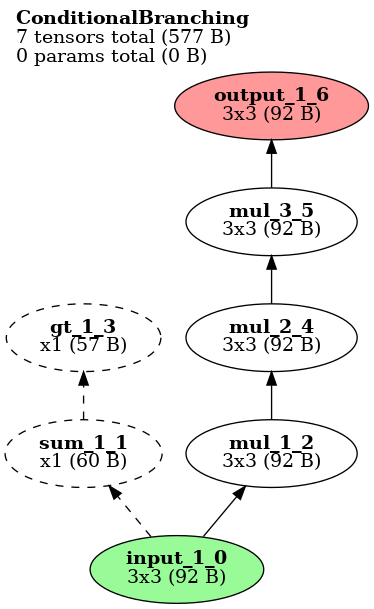

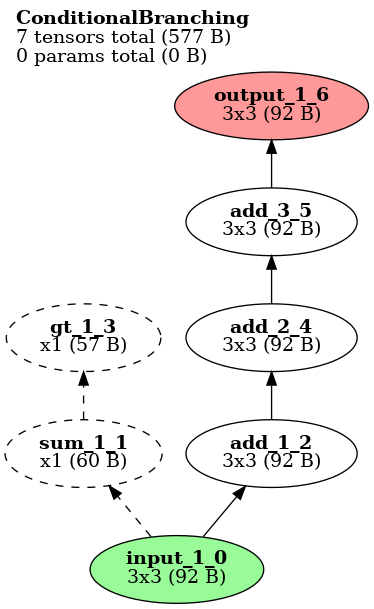

Log of ConditionalBranching forward pass:
	Model structure: purely feedforward, with branching; 0 total modules.
	7 tensors (577 B) computed in forward pass; 7 tensors (577 B) saved.
	0 parameter operations (0 params total; 0 B).
	Random seed: 2283276130
	Time elapsed: 0.003s
	Module Hierarchy:
	Layers:
		0: input_1_0 
		1: sum_1_1 
		2: add_1_2 
		3: gt_1_3 
		4: add_2_4 
		5: add_3_5 
		6: output_1_6 

In [8]:
class ConditionalBranching(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        if (
            torch.sum(x) > 0
        ):  # model does one set of computations if the mean of the input tensor exceeds some value...
            x = x + 1
            x = x + 1
            x = x + 1
        else:  #  ...and a different set otherwise
            x = x * 2
            x = x * 2
            x = x * 2
        return x


conditional_model = ConditionalBranching()
zeros = torch.zeros(3, 3)
ones = torch.ones(3, 3)
tl.get_model_activations(
    conditional_model, zeros, vis_opt="unrolled"
)  # try with all zeros
tl.get_model_activations(
    conditional_model, ones, vis_opt="unrolled"
)  # try with all ones

### Models with nested module structure
Torchlens will depict the nested module structure of the model in the visual, with any level of hierarchical nesting.


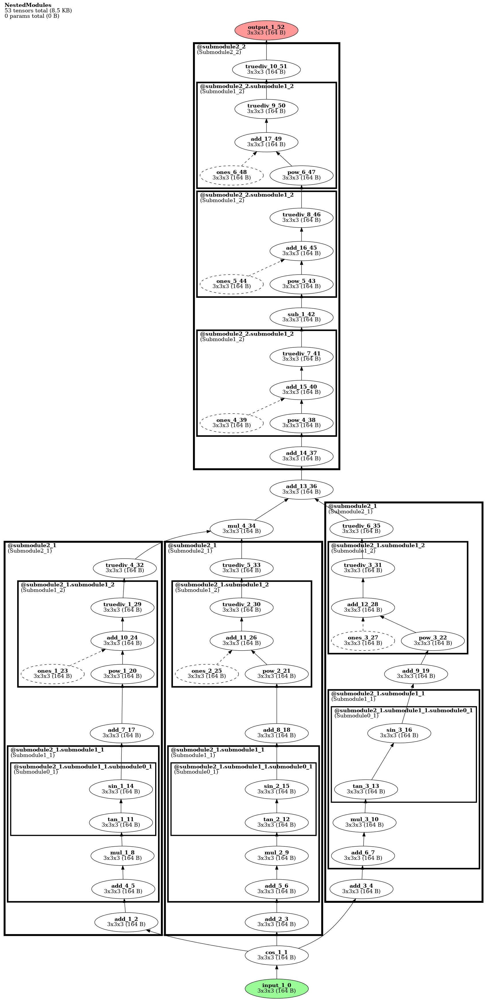

Log of NestedModules forward pass:
	Model structure: purely feedforward, with branching; 6 total modules.
	53 tensors (8.5 KB) computed in forward pass; 53 tensors (8.5 KB) saved.
	0 parameter operations (0 params total; 0 B).
	Random seed: 81571865
	Time elapsed: 0.048s
	Module Hierarchy:
		submodule2_1:
		    submodule2_1.submodule1_1
		        submodule2_1.submodule1_1.submodule0_1
		    submodule2_1.submodule1_2:
		submodule2_1:
		    submodule2_1.submodule1_1
		        submodule2_1.submodule1_1.submodule0_1
		    submodule2_1.submodule1_2:
		submodule2_1:
		    submodule2_1.submodule1_1
		        submodule2_1.submodule1_1.submodule0_1
		    submodule2_1.submodule1_2:
		submodule2_2:
		    submodule2_2.submodule1_2, submodule2_2.submodule1_2, submodule2_2.submodule1_2
	Layers:
		0: input_1_0 
		1: cos_1_1 
		2: add_1_2 
		3: add_2_3 
		4: add_3_4 
		5: add_4_5 
		6: add_5_6 
		7: add_6_7 
		8: mul_1_8 
		9: mul_2_9 
		10: mul_3_10 
		11: tan_1_11 
		12: tan_2_12 
		13: tan_3_13 
		

In [9]:
class Submodule0_1(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        x = torch.tan(x)
        x = torch.sin(x)
        return x


class Submodule1_1(nn.Module):
    def __init__(self):
        super().__init__()
        self.submodule0_1 = Submodule0_1()

    def forward(self, x):
        x = x + 1
        x = x * 2
        x = self.submodule0_1(x)
        return x


class Submodule1_2(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        x = x**3 + torch.ones(x.shape)
        x = x / 5
        return x


class Submodule2_1(nn.Module):
    def __init__(self):
        super().__init__()
        self.submodule1_1 = Submodule1_1()
        self.submodule1_2 = Submodule1_2()

    def forward(self, x):
        x = x + 1
        x = self.submodule1_1(x)
        x = x + 9
        x = self.submodule1_2(x)
        x = x / 5
        return x


class Submodule2_2(nn.Module):
    def __init__(self):
        super().__init__()
        self.submodule1_1 = Submodule1_1()
        self.submodule1_2 = Submodule1_2()

    def forward(self, x):
        x = x + 9
        x = self.submodule1_2(x)
        x = x - 5
        x = self.submodule1_2(self.submodule1_2(x))
        x = x / 5
        return x


class NestedModules(nn.Module):
    def __init__(self):
        super().__init__()
        self.submodule2_1 = Submodule2_1()
        self.submodule2_2 = Submodule2_2()

    def forward(self, x):
        x = torch.cos(x)
        x1 = self.submodule2_1(x)
        x2 = self.submodule2_1(x)
        x3 = self.submodule2_1(x)
        x = x1 * x2 + x3
        x = self.submodule2_2(x)
        return x


nested_module_model = NestedModules()
x = torch.rand(3, 3, 3)
tl.get_model_activations(nested_module_model, x, vis_opt="unrolled")

### Models with randomness
If the model is stochastic in some way, you can set the random seed to guarantee the same results when calling the function. For example, this model has a recurrent loop that repeats a random number of times, and by setting the same random seed, you can ensure the same number of loops.

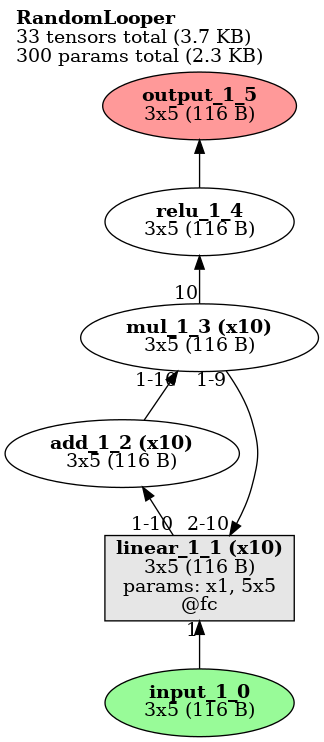

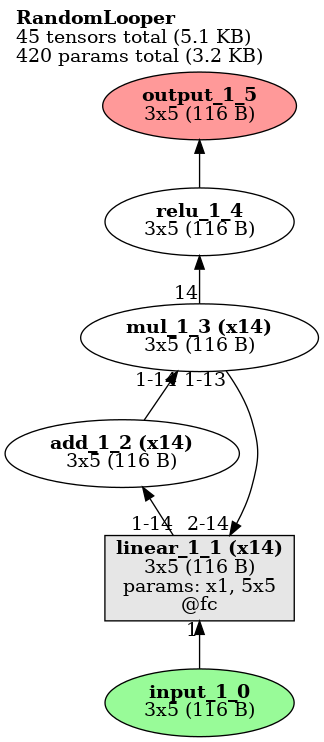

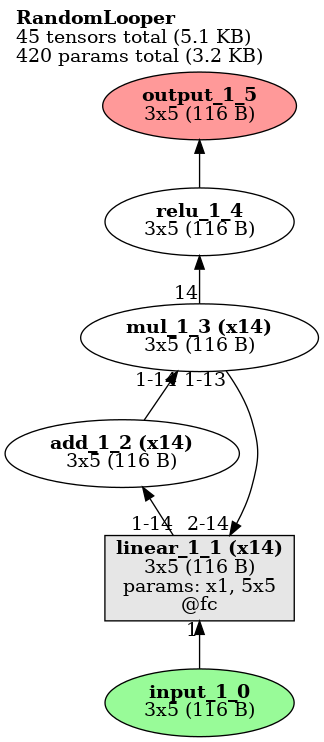

Log of RandomLooper forward pass:
	Model structure: recurrent (at most 14 loops), without branching; 1 total modules.
	45 tensors (5.1 KB) computed in forward pass; 45 tensors (5.1 KB) saved.
	28 parameter operations (420 params total; 3.2 KB).
	Random seed: 19
	Time elapsed: 0.072s
	Module Hierarchy:
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
		fc
	Layers:
		0: input_1_0 
		1: linear_1_1:1  (1/14 passes)
		2: add_1_2:1  (1/14 passes)
		3: mul_1_3:1  (1/14 passes)
		4: linear_1_1:2  (2/14 passes)
		5: add_1_2:2  (2/14 passes)
		6: mul_1_3:2  (2/14 passes)
		7: linear_1_1:3  (3/14 passes)
		8: add_1_2:3  (3/14 passes)
		9: mul_1_3:3  (3/14 passes)
		10: linear_1_1:4  (4/14 passes)
		11: add_1_2:4  (4/14 passes)
		12: mul_1_3:4  (4/14 passes)
		13: linear_1_1:5  (5/14 passes)
		14: add_1_2:5  (5/14 passes)
		15: mul_1_3:5  (5/14 passes)
		16: linear_1_1:6  (6/14 passes)
		17: add_1_2:6  (6/14 passes)
		18: mul_1_3:6  (6/14 passes)
		19: linear_1_1:7  (7/14 passes)
	

In [10]:
import numpy as np


class RandomLooper(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Linear(5, 5)

    def forward(self, x):
        num_repeats = np.random.choice(range(20))
        for repeat in range(num_repeats):
            x = self.fc(x)
            x = x + 5
            x = x * 2
        x = nn.functional.relu(x)
        return x


x = torch.rand(3, 5)
random_model = RandomLooper()
tl.get_model_activations(
    random_model, x, random_seed=3, vis_opt="rolled"
)  # one random seed
tl.get_model_activations(
    random_model, x, random_seed=19, vis_opt="rolled"
)  # different random seed, different results
tl.get_model_activations(
    random_model, x, random_seed=19, vis_opt="rolled"
)  # keeping the same seed ensures the same result

### CORNet_S
Torchlens is designed to handle any model you want as-is, including complex models like [cornet_s](https://dicarlolab.mit.edu/cornet-modeling-neural-mechanisms-core-object-recognition).


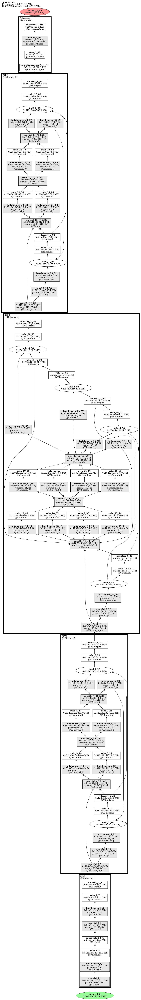

In [11]:
from cornet import cornet_s

x = torch.rand(6, 3, 256, 256)
cornet_model = cornet_s()
tl.show_model_graph(cornet_model, x, vis_opt="rolled")

### GoogLeNet
Here, since GoogLeNet is a large network, the function show_model_graph is used instead of get_model_activations; this function shows the same visual without saving any tensors.

/home/jtaylor/anaconda3/envs/py39/lib/python3.9/site-packages/torchvision/models/googlenet.py:77: FutureWarning: The default weight initialization of GoogleNet will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn('The default weight initialization of GoogleNet will be changed in future releases of '


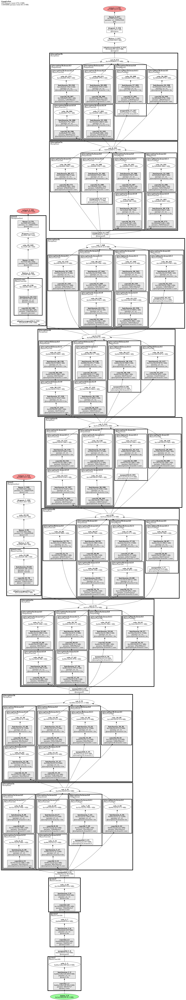

In [12]:
googlenet = torchvision.models.googlenet(pretrained=False)
x = torch.rand(6, 3, 256, 256)
tl.show_model_graph(googlenet, x, vis_opt="unrolled")

### Taskonomy network


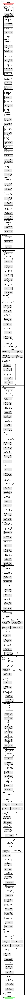

In [13]:
import visualpriors

taskonomy_model = visualpriors.taskonomy_network.TaskonomyNetwork()
x = torch.rand(6, 3, 256, 256)
tl.show_model_graph(taskonomy_model, x, vis_opt="unrolled")

### Squeezenet


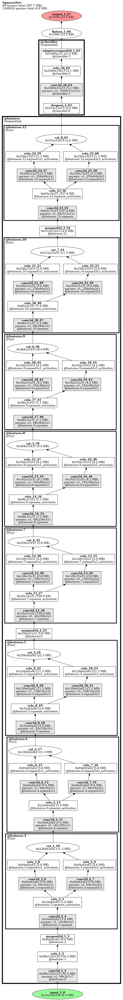

In [14]:
squeezenet = torchvision.models.squeezenet1_0(pretrained=False)
x = torch.rand(6, 3, 256, 256)
tl.show_model_graph(squeezenet, x, vis_opt="unrolled")

### Other torchlens functionality
The main function in torchlens is get_model_activations, which saves the activations and accompanying info about the computation graph, and visualizes the graph if desired. If you wish to inspect the computation graph without saving activations, two additional functions are provided: show_model_graph to simply show the visual (used above), and get_model_structure to get the structure of the model without saving activations. These functions can be helpful for picking out which layers you want to save before filling up your computer's memory with huge tensors; you can then call get_model_activations using the which_layers argument to only save the results of a subset of layers:

In [15]:
x = torch.ones(6, 3, 256, 256)
model_struct = tl.get_model_structure(alexnet, x)
which_layers = []
for layer in model_struct:
    if layer.func_applied_name == "relu":
        which_layers.append(layer.layer_barcode)
tl.get_model_activations(alexnet, x, which_layers=which_layers)

Log of AlexNet forward pass:
	Model structure: purely feedforward, without branching; 7 total modules.
	24 tensors (37.6 MB) computed in forward pass; 7 tensors (14.8 MB) saved.
	16 parameter operations (61100840 params total; 248.7 MB).
	Random seed: 2423129684
	Time elapsed: 0.276s
	Module Hierarchy:
		features:
		    features.0, features.1, features.2, features.3, features.4, features.5, features.6, features.7, 
		    features.8, features.9, features.10, features.11, features.12
		avgpool
		classifier:
		    classifier.0, classifier.1, classifier.2, classifier.3, classifier.4, classifier.5, classifier.6
	Layers:
		0: relu_1_2 
		1: relu_2_5 
		2: relu_3_8 
		3: relu_4_10 
		4: relu_5_12 
		5: relu_6_18 
		6: relu_7_21 

Since the worst kind of error is a silent one, torchlens also has one final core function, **validate_saved_activations**, that verifies the correctness of the saved activations by re-running the forward pass from each intermediate step of the model using the saved activations at that step, and confirming that the resulting output matches the ground truth output. As a further test, it also substitutes in random nonsense activations instead of the saved activations at each step of this procedure, and verifies that this also changes the resulting output.


In [16]:
tl.validate_saved_activations(alexnet, x, verbose=True)

Perturbing forward passes for saved activations: 100%|██████████| 23/23 [00:00<00:00, 46.58it/s] 


True

The function returns True, indicating that AlexNet's activations were saved correctly. This procedure has been run on the full torchvision model zoo, cornet_s, cornet_z, and on the taskonomy network, with more networks gradually being added. The goal is for torchlens to work for any PyTorch model whatsoever. <u>If it ever returns False on your model, please email johnmarkedwardtaylor@gmail.com with details and torchlens will be updated to work with your model; this would be greatly appreciated, since this will also allow torchlens to work for other models that might share similar quirks as yours.</u>

And that's it: one main function (get_model_activations), two secondary functions (get_model_structure and show_model_graph) to help select subsets of layers to save if not all layers are desired, and a sanity-check function (validate_saved_activations) to verify the correctness of saved activations.



In [3]:
def decorate(func):
    def decorated_func(*args, **kwargs):
        print("This function is decorated")
        return func(*args, **kwargs)

    return decorated_func


def add(x, y):
    return x + y


decorated_add1 = decorate(add)

print(add(2, 3))
print(decorated_add1(2, 3))


@decorate
def add(x, y):
    return x + y

5
This function is decorated
5
This function is decorated
5


In [5]:
from cornet import cornet_s
import torchlens as tl
import torch

cornet_model = cornet_s()
x = torch.rand(6, 3, 256, 256)
model_history = tl.get_model_activations(cornet_model, x, vis_opt="rolled")

************
Feature extraction failed; returning model and environment to normal
*************


RuntimeError: CUDA out of memory. Tried to allocate 36.00 MiB (GPU 0; 10.76 GiB total capacity; 217.52 MiB already allocated; 46.44 MiB free; 228.00 MiB reserved in total by PyTorch)